# Install dependacies and import libraries

Firstly we will need to install a few things, namely pytorch! Each time you run the notebook you'll need to reinstall.

In [1]:
# Url management.
import io
from six.moves.urllib.request import urlopen

# For teacher forcing.
import random

# Audio libraries.
import IPython
import librosa
import librosa.display

# A very useful numerical package.
import numpy as np

# NumPy on steriods.
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.autograd import Variable

# Stats for outlier detection.
from scipy import stats
from sklearn import svm
from sklearn import decomposition
from sklearn.neighbors import LocalOutlierFactor

# To make nice plots.
import matplotlib.font_manager
import matplotlib.pyplot as plt

In [2]:
def to_var(x):
  if torch.cuda.is_available():
      x = x.cuda()
  return Variable(x)

# Build models

Now we build the generator and discriminator

In [3]:
class EncoderRNN(nn.Module):
  
  """The encoder takes a batch of FFT frame sequences and returns encodings.
  
  There are no embeddings as the inputs are already real values, and the
  objective is to take FFT frames sequences (batch_size, sequence_length,
  fft_size) and return the encodings (batch_size, sequence_length, hidden_size).
  """
  
  def __init__(self, 
               input_size, 
               batch_size,
               hidden_size, 
               number_layers=1, 
               dropout=0.1,
               bi_directional=True,
               rnn=nn.GRU):
    
    """The __init__ function.

    Sets up the encoder with the specified amount of layers and hidden size.
    Uses a different mask for each timestep, which has been shown to perform
    worse than if the mask was the same, for diffent layers at different
    timesteps as in https://arxiv.org/abs/1512.05287. So be wary of this! To
    entirely cancel out the dropout, just set dropout to zero.
    
    Arguments:
      input_size: Size of the input FFT frames.
      hidden_size: Size of the hidden learnable weights for the RNN.
      number_layers: How many layers the encoding RNN should have.
      dropout: Zero for no dropout, one for complete dropout.
      bi_directional: Whether or not the RNN should run in two directions.
      rnn_type: Pass a RNN module here such as nn.GRU or nn.LSTM.
    """
    
    super(EncoderRNN, self).__init__()
    
    self.input_size = input_size
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.number_layers = number_layers
    self.dropout = dropout
    self.bi_directional = bi_directional
    self.rnn = rnn(input_size=input_size,
                   hidden_size=hidden_size,
                   num_layers=number_layers, 
                   bidirectional=bi_directional,
                   batch_first=True)
    
    
  def forward(self, x, hidden):
    """The forward propoagation function. 
    
    The 
    """
    
    x, hidden = self.rnn(x, hidden)
    
    # linearly sum bi-directional outputs if appropriate.
    if self.bi_directional:
      forward = x[:, :, :self.hidden_size]
      backward = x[:, : ,self.hidden_size:]
      x = forward + backward
    
    return x, hidden
  
  
  def init_hidden(self):
    """"""
    amount = 2 if self.bi_directional else 1
    tensor = torch.FloatTensor(self.number_layers * amount, 
                               self.batch_size, 
                               self.hidden_size)
    return to_var(tensor.fill_(0))

  
  
class Attention(nn.Module):
  
  """An attention module that can switch between different scoring methods.
  
  The general form of the attention calculation uses the target decoder hidden
  state and the encoder state.
  
  Find the scoring methods here: https://arxiv.org/abs/1508.04025. The options
  are; 'dot', a dot product between the decoder and encoder state; 'general', 
  the dot product between the decoder state and a linear transform of the
  encoder state; 'concat', a dot product between a new parameter 'v' and a 
  linear transform of the states concatenated together. Finally the result is
  normalised.
  """
  
  def __init__(self, method, batch_size, hidden_size, bias=True):
    super(Attention, self).__init__()
    
    self.method = method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    
    
    
    if self.method == 'general':
      self.attention = nn.Linear(hidden_size, hidden_size, bias=bias)
      
    elif self.method == 'concat':
      self.attention = nn.Linear(hidden_size * 2, hidden_size, bias=bias)
      self.v = nn.Parameter(torch.FloatTensor(batch_size, 1, hidden_size))
      
    
  def forward(self, hidden, encoder_outputs):
    max_length = encoder_outputs.size(1)
    
    if self.method == 'general':
      attention_energies = self.attention(encoder_outputs).transpose(2, 1)
      attention_energies = hidden.bmm(attention_energies)
    
    elif self.method == 'concat':
      # Broadcast hidden to encoder_outputs size.
      hidden *= to_var(encoder_outputs.data.new(encoder_outputs.size()).fill_(1))
      concat = torch.cat((hidden, encoder_outputs), -1)
      attention_energies = self.attention(concat)
      
      # Swap the second and first dimensions. 
      attention_energies = attention_energies.transpose(2, 1)
      attention_energies = self.v.bmm(attention_energies)
      
    else:
      # Method is 'dot'.
      encoder_outputs = encoder_outputs.transpose(2, 1)
      attention_energies = hidden.bmm(encoder_outputs)
      
    return F.softmax(attention_energies)
    
  
  
  def score(self, hidden, encoder_output):
    
    if self.method == 'dot':
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'general':
      energy = self.attention(encoder_output)
      energy = hidden.dot(encoder_output)
      
    elif self.method == 'concat':
      concat = torch.cat((hidden, encoder_output), 1)
      energy = self.attention(concat)
      energy = self.v.dot(energy)
      
    return energy
      
        

class AttentionDecoderRNN(nn.Module):
  
  """Luong Attention Decoder RNN module.
  
  This decoder plugs in the Attention module ater the RNN to calculate the """
  
  def __init__(self, 
               attention_method,
               batch_size,
               hidden_size, 
               output_size, 
               number_layers=1, 
               dropout=0.1):
    
    super(AttentionDecoderRNN, self).__init__()
    
    self.attention_method = attention_method
    self.batch_size = batch_size
    self.hidden_size = hidden_size
    self.output_size = output_size
    self.number_layers = number_layers
    self.dropout = dropout
    
    self.rnn = nn.GRU(hidden_size, 
                      hidden_size, 
                      number_layers, 
                      dropout=dropout, 
                      batch_first=True)
    
    self.concat = nn.Linear(hidden_size * 2, hidden_size)
    self.output = nn.Linear(hidden_size, output_size)
    
    self.attention = Attention(attention_method, batch_size, hidden_size)
    
    
  def forward(self, input_sequence, last_hidden, encoder_outputs):
    
    # Get current hidden state from input sequence and last hidden state.
    rnn_output, hidden = self.rnn(input_sequence, last_hidden)
    
    # Calculate attention from the current RNN state and all encoder outputs.
    attention_weights = self.attention(rnn_output, encoder_outputs)
    
    # bmm = batch matrix matrix product. Apply attention to encoder outputs to
    # get the weighted average.
    context = attention_weights.bmm(encoder_outputs)
    
    # Attentional vector using the RNN hidden state and context vector
    # concatenated together (Luong eq. 5).
    concat_input = torch.cat((rnn_output, context), -1)
    concat_output = F.tanh(self.concat(concat_input))
    
    # Finally predict next frame (Luong eq. 6, without softmax).
    output = self.output(concat_output)
    
    # Return final output, hidden state, and attention weights. We can use the
    # attention weights for visualisation.
    return output, hidden, attention_weights

# Test the encoder and decoder

In [4]:
if False:
  test_hidden_size     = 32
  test_input_size      = 32
  test_number_layers   = 3
  test_batch_size      = 16
  test_sequence_length = 7

  encoder_test = EncoderRNN(input_size=test_input_size,
                            batch_size=test_batch_size,
                            hidden_size=test_hidden_size,
                            number_layers=test_number_layers)
  
  decoder_test = AttentionDecoderRNN(attention_method='general',
                                     batch_size=test_batch_size,
                                     hidden_size=test_hidden_size,
                                     output_size=test_input_size,
                                     number_layers=test_number_layers)

  if torch.cuda.is_available():
    encoder_test.cuda()
    decoder_test.cuda()

  test_input_batches = to_var(torch.zeros(test_batch_size,
                                          test_sequence_length, 
                                          test_input_size))
  test_target_batches = to_var(torch.zeros(test_batch_size,
                                           test_sequence_length, 
                                           test_input_size))

  test_encoder_hidden = encoder_test.init_hidden()
  test_encoder_outputs, test_encoder_hidden = encoder_test(test_input_batches, 
                                                           test_encoder_hidden)

  # (batch_size, sequence_length, hidden_size)
  print('encoder outputs size      {}'.format(tuple(test_encoder_outputs.size())))

  # (number_layers * num_directions, sequence_length, hidden_size)
  print('encoder hidden state size {}'.format(tuple(test_encoder_hidden.size())))

  test_decoder_input = to_var(torch.zeros(test_batch_size, 
                                          test_sequence_length, 
                                          test_hidden_size))
  test_decoder_hidden = test_encoder_hidden[:decoder_test.number_layers]
 

  test_decoder_output, test_decoder_hidden, test_decoder_attention = \
    decoder_test(test_decoder_input, test_decoder_hidden, test_encoder_outputs)

  test_criterion = nn.MSELoss()
  test_loss = test_criterion(test_decoder_output, test_target_batches)
  print(test_loss.data[0])

# Utilites

You can look for music urls [here](https://www.jewelbeat.com/free/free-background-music.htm)

In [5]:
class AudioDataset():
    """A class to convert audio found at an url to magnitude frames."""

    def __init__(self,
                 fft_size,
                 hop_length,
                 batch_size,
                 sequence_length,
                 path=None,
                 limit=None):

        self.fft_size = fft_size
        self.feature_size = (fft_size // 2) + 1
        self.hop_length = hop_length

        self.data, self.sample_rate = librosa.load(path, mono=True)

        if limit is not None:
            self.data = self.data[:limit * self.sample_rate]

        # Get features to train on.
        self.stfts = librosa.stft(self.data,
                                  n_fft=fft_size,
                                  hop_length=hop_length)
        self.magnitudes, _ = librosa.magphase(self.stfts.T)

        self.dataset_size = len(self.magnitudes) - sequence_length * 2 - 1
        input_shape = (self.dataset_size, sequence_length, self.feature_size)
        target_shape = input_shape
        self.batch_size = batch_size
        self.x = np.zeros(input_shape, dtype=np.float32)
        self.y = np.zeros(target_shape, dtype=np.float32)

        for i, x_start in enumerate(range(0, self.dataset_size)):
            y_start = x_end = x_start + sequence_length
            y_end = y_start + sequence_length

            self.x[i] = self.magnitudes[x_start:x_end]
            self.y[i] = self.magnitudes[y_start:y_end]

    def get_next_batch(self, amount_epochs):

        for epoch in range(amount_epochs):

            permuation = np.random.permutation(len(self.x))
            x, y = self.x[permuation], self.y[permuation]

            for start in range(0, len(x) - self.batch_size, self.batch_size):
                end = start + self.batch_size

                batch_x = torch.from_numpy(x[start:end])
                batch_y = torch.from_numpy(y[start:end])

                yield to_var(batch_x), to_var(batch_y), epoch
        
        
        
def griffin_lim(spectrogram, n_iter=100, window='hann', n_fft=2048, hop_length=-1):
  if hop_length == -1:
    hop_length = n_fft // 4

  angles = np.exp(2j * np.pi * np.random.rand(*spectrogram.shape))

  for i in range(n_iter):
    full = np.abs(spectrogram).astype(np.complex) * angles
    inverse = librosa.istft(full, hop_length = hop_length, window = window)
    rebuilt = librosa.stft(inverse, n_fft = n_fft, hop_length = hop_length, window = window)
    angles = np.exp(1j * np.angle(rebuilt))

  full = np.abs(spectrogram).astype(np.complex) * angles
  inverse = librosa.istft(full, hop_length = hop_length, window = window)

  return inverse
    
  
  
def outlier_detection(data, 
                      contamination_fraction=0.25, 
                      amount_neighbours=35, 
                      figure_width=8,
                      append_covariance=False,
                      inline=False):
  
  # Get rank-2 data points.
  number_data_points = len(data)
  data = np.array(data).reshape((number_data_points, -1))

  # perform dimensionality reduction if necessary for visualisation.
  if data.shape[1] > 2:
    pca = decomposition.PCA(n_components=2)
    pca.fit(data)
    data = pca.transform(data)
    
  # Setup.
  xx, yy = np.meshgrid(np.linspace(data.min(), data.max(), 100), 
                       np.linspace(data.min(), data.max(), 100))
    
  # Instanciate outlier detection methods and find anomolies & descision bounds.
  lof = LocalOutlierFactor(n_neighbors=amount_neighbours,
                           contamination=contamination_fraction)
  lof_predictions = lof.fit_predict(data)
  lof_scores_pred = lof.negative_outlier_factor_
  lof_threshold = stats.scoreatpercentile(lof_scores_pred, 
                                          100 * contamination_fraction)
  lof_z = lof._decision_function(np.c_[xx.ravel(), yy.ravel()])
  
  # Plot everything.
  plot_data = [
      ('Local Outlier Factor', lof_z, lof_threshold, lof_predictions)
  ]
  
  # Add robust covarince method. Need fix decision boundary!
  if append_covariance:
    env = EllipticEnvelope(contamination=contamination_fraction)
    env.fit(data)
    env_predictions = env.decision_function(data)
    env_scores_pred = env.predict(data)
    env_threshold = stats.scoreatpercentile(env_scores_pred,
                                            100 * contamination_fraction)
    env_z = env.decision_function(np.c_[xx.ravel(), yy.ravel()])
    cova_data = ('Robust Covariance', env_z, env_threshold, env_scores_pred)
    plot_data.append(cova_data)
    
  fig = plt.figure(figsize=(figure_width, figure_width * len(plot_data)))
  plot_number = 1
  for title, z, threshold, predictions in plot_data:
    z = z.reshape(xx.shape)
    sub_plot = fig.add_subplot(len(plot_data), 1, plot_number)
    sub_plot.contourf(xx, yy, z, levels=np.linspace(z.min(), threshold, 7), cmap=plt.cm.Blues_r)
    sub_plot.contour(xx, yy, z, levels=[threshold], linewidths=2, colors='red')
    sub_plot.contourf(xx, yy, z, levels=[threshold, z.max()], colors='orange')

    inliers = data[np.where(predictions == 1)]
    outliers = data[np.where(predictions == -1)]
    sub_plot.scatter(inliers[:,0], inliers[:,1], c='white', s=20, edgecolor='k')
    sub_plot.scatter(outliers[:,0], outliers[:,1], c='black', s=20, edgecolor='k')

    sub_plot.axis('tight')
    sub_plot.set_xlabel(title)
    sub_plot.set_xlim((data.min(), data.max()))
    sub_plot.set_ylim((data.min(), data.max()))
    
    plot_number += 1
  
  # Convert to NumPy array and return!
  fig.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
  fig.suptitle("Outlier detection")
  
  if not inline:
    plt.close()
  else:
    fig.savefig('outlier_detection.png', dpi=fig.dpi)
  
  return fig, np.where(lof_predictions == -1)[0]



def plot_audio(data):
  plt.figure()
  stft = librosa.amplitude_to_db(librosa.stft(data), ref=np.max)
  librosa.display.specshow(stft, y_axis='log')
  plt.show()
  

# Train and inference functions

In [6]:
def train(encoder, 
          decoder, 
          encoder_optimiser,
          decoder_optimiser, 
          input_batch, 
          target_batch,
          criterion,
          clip_threshold):
  
  # Zero the gradients of both optimisers.
  encoder_optimiser.zero_grad()
  decoder_optimiser.zero_grad()
  
  batch_size, sequence_length, fft_size = tuple(input_batch.size())
  
  # Run the input batch of fft sequences through the encoder.
  encoder_hidden = encoder.init_hidden()
  encoder_outputs, encoder_hidden = encoder(input_batch, encoder_hidden)
  
  # Prepare the input and output variables.
  decoder_input = input_batch
  decoder_hidden = encoder_hidden[:decoder.number_layers]
  
  decoder_output, decoder_hidden, decoder_attention = \
    decoder(decoder_input, decoder_hidden, encoder_outputs)
   
  # How close were we to the targets?
  loss = criterion(decoder_output, target_batch)
  loss.backward()
  
  # Clip the gradient norms.
  torch.nn.utils.clip_grad_norm(encoder.parameters(), clip_threshold)
  torch.nn.utils.clip_grad_norm(decoder.parameters(), clip_threshold)
  
  # Update parameters with optimisers.
  encoder_optimiser.step()
  decoder_optimiser.step()
  
  return loss.data[0]   

In [7]:
def run(encoder, 
        decoder, 
        start_sequences,
        amount_frames):
  
  encoder.train(False)
  decoder.train(False)
  
  # Get random sequence from dataset object. 
  batch_size, sequence_length, fft_size = start_sequences.size()
  model_input = start_sequences.view(batch_size, sequence_length, fft_size)
  
  frames = np.zeros((amount_frames, batch_size, sequence_length, fft_size))
  
  # Repeatedly sample the RNN and get the output.
  for i in range(amount_frames):

    encoder_hidden = encoder.init_hidden()
    encoder_outputs, encoder_hidden = encoder(model_input, encoder_hidden)
    
    decoder_input = model_input
    decoder_hidden = encoder_hidden[:decoder.number_layers]
    
    decoder_output, decoder_hidden, _ = \
      decoder(decoder_input, decoder_hidden, encoder_outputs)

    model_input = decoder_output    
    frames[i] = Variable(decoder_output.data).cpu().data.numpy()
    
  encoder.train(True)
  decoder.train(True)
    
  return frames.reshape((batch_size, -1, fft_size))
  

# Hyper parameters

In [8]:
!ls massive_chops/trimmed

atmos_trimmed.wav  harpsi_trimmed.wav	  piano_trimmed.wav
bass_trimmed.wav   mellotron_trimmed.wav  vocals_trimmed.wav
drums_trimmed.wav  organ_trimmed.wav


Settings Done.
Encoder Done.
Decoder Done.


/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


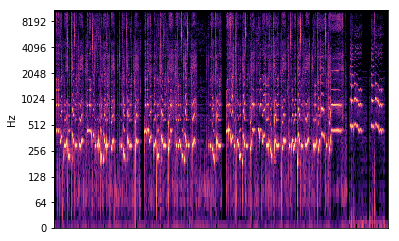

In [9]:
# Hyper parameters.
seed                   = 42
attention_method       = 'general'
fft_size               = 1024
number_layers          = 3
dropout                = 0.0
sequence_length        = 150 # was 50, 150
clip_threshold         = 5.0
criterion              = nn.MSELoss()
learning_rate          = 0.00001
decoder_learning_ratio = 5.0
batch_size             = 8 # was 64
number_epochs          = 100
evaluate_every_epoch   = 5
feature_size = input_size = hidden_size = (fft_size // 2) + 1
hop_length = fft_size // 4

path = "./massive_chops/trimmed/vocals_trimmed.wav"

print("Settings Done.")

# Construct RNNs and optimisers.
encoder = EncoderRNN(input_size=feature_size,
                     batch_size=batch_size,
                     hidden_size=feature_size,
                     number_layers=number_layers,
                     dropout=dropout)

print("Encoder Done.")

decoder = AttentionDecoderRNN(attention_method,
                              batch_size=batch_size,
                              hidden_size=hidden_size,
                              output_size=feature_size,
                              number_layers=number_layers,
                              dropout=dropout)

print("Decoder Done.")

# Enable GPU tensors provided GPUs actually exist!
if torch.cuda.is_available():
  encoder.cuda()
  decoder.cuda()
  criterion.cuda()
  torch.cuda.manual_seed(seed)
else:
  torch.manual_seed(seed)
  
encoder_optimiser = torch.optim.Adam(encoder.parameters(), lr=learning_rate)
decoder_optimiser = torch.optim.Adam(decoder.parameters(), 
                                     lr=learning_rate * decoder_learning_ratio)

dataset = AudioDataset(fft_size=fft_size,
                       hop_length=hop_length,
                       batch_size=batch_size,
                       sequence_length=sequence_length,
                       path=path)

# Plot and listen to the audio.
plot_audio(dataset.data) 
IPython.display.Audio(dataset.data, rate=dataset.sample_rate)

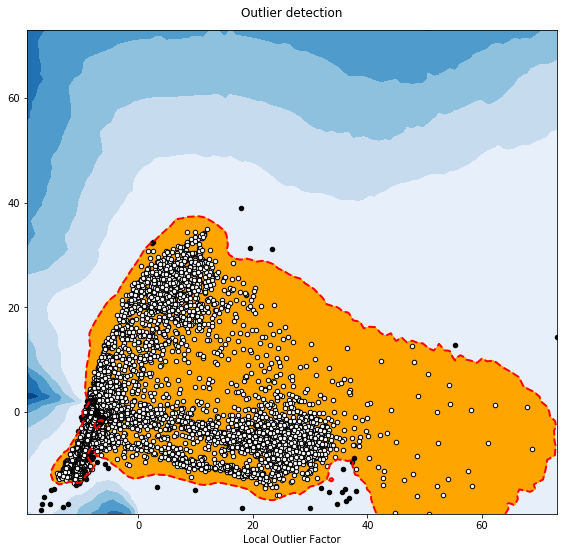

In [10]:
_ = outlier_detection(dataset.magnitudes, contamination_fraction=0.01, inline=True)

/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


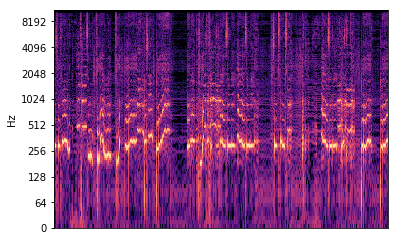

epoch 0/100, loss 0.042229652404785156
epoch 0/100, loss 0.028209378942847252
epoch 0/100, loss 0.03134267032146454
epoch 0/100, loss 0.022256480529904366
epoch 0/100, loss 0.021091144531965256
epoch 0/100, loss 0.024323489516973495
epoch 0/100, loss 0.026108691468834877
epoch 0/100, loss 0.02588464319705963
epoch 0/100, loss 0.01536096353083849
epoch 0/100, loss 0.02777273580431938
epoch 0/100, loss 0.023357583209872246
epoch 0/100, loss 0.02171095460653305
epoch 0/100, loss 0.015862394124269485
epoch 0/100, loss 0.01915859244763851
epoch 0/100, loss 0.027362758293747902
epoch 0/100, loss 0.04886661469936371
epoch 0/100, loss 0.036650367081165314
epoch 0/100, loss 0.015205638483166695
epoch 0/100, loss 0.03311581537127495
epoch 0/100, loss 0.034512560814619064
epoch 0/100, loss 0.023313011974096298
epoch 0/100, loss 0.04297156259417534
epoch 0/100, loss 0.020273376256227493
epoch 0/100, loss 0.015406223945319653
epoch 0/100, loss 0.02110174484550953
epoch 0/100, loss 0.025475526228547

epoch 0/100, loss 0.017304887995123863
epoch 0/100, loss 0.01946817710995674
epoch 0/100, loss 0.020792048424482346
epoch 0/100, loss 0.01630198396742344
epoch 0/100, loss 0.03391717001795769
epoch 0/100, loss 0.018686799332499504
epoch 0/100, loss 0.017079325392842293
epoch 0/100, loss 0.03130694851279259
epoch 0/100, loss 0.026414446532726288
epoch 0/100, loss 0.020179076120257378
epoch 0/100, loss 0.024105630815029144
epoch 0/100, loss 0.02596035972237587
epoch 0/100, loss 0.02359207533299923
epoch 0/100, loss 0.033664315938949585
epoch 0/100, loss 0.029742691665887833
epoch 0/100, loss 0.018072735518217087
epoch 0/100, loss 0.0168316513299942
epoch 0/100, loss 0.02696859836578369
epoch 0/100, loss 0.02505161426961422
epoch 0/100, loss 0.023680297657847404
epoch 0/100, loss 0.01895221695303917
epoch 0/100, loss 0.01729261502623558
epoch 0/100, loss 0.0326140858232975
epoch 0/100, loss 0.020283611491322517
epoch 0/100, loss 0.02108309045433998
epoch 0/100, loss 0.02168380655348301
ep

epoch 0/100, loss 0.018323509022593498
epoch 0/100, loss 0.03402930498123169
epoch 0/100, loss 0.024046188220381737
epoch 0/100, loss 0.039371293038129807
epoch 0/100, loss 0.02458324283361435
epoch 0/100, loss 0.02371942065656185
epoch 0/100, loss 0.008019547909498215
epoch 0/100, loss 0.01694236882030964
epoch 0/100, loss 0.03438641130924225
epoch 0/100, loss 0.03772938624024391
epoch 0/100, loss 0.024048101156949997
epoch 0/100, loss 0.02876684069633484
epoch 0/100, loss 0.01753029227256775
epoch 0/100, loss 0.020346922799944878
epoch 0/100, loss 0.02960445173084736
epoch 0/100, loss 0.0323508195579052
epoch 0/100, loss 0.01612529717385769
epoch 0/100, loss 0.017730282619595528
epoch 0/100, loss 0.018044864758849144
epoch 0/100, loss 0.016564050689339638
epoch 0/100, loss 0.0275226179510355
epoch 0/100, loss 0.023794768378138542
epoch 0/100, loss 0.017638543620705605
epoch 0/100, loss 0.027515558525919914
epoch 0/100, loss 0.019674276933073997
epoch 0/100, loss 0.015140088275074959


epoch 0/100, loss 0.034256622195243835
epoch 0/100, loss 0.018038252368569374
epoch 0/100, loss 0.031762149184942245
epoch 0/100, loss 0.027454618364572525
epoch 0/100, loss 0.02428387477993965
epoch 0/100, loss 0.01925957016646862
epoch 0/100, loss 0.018002893775701523
epoch 0/100, loss 0.018256239593029022
epoch 0/100, loss 0.030612600967288017
epoch 0/100, loss 0.025556091219186783
epoch 0/100, loss 0.022611772641539574
epoch 0/100, loss 0.0169769786298275
epoch 0/100, loss 0.01351761631667614
epoch 0/100, loss 0.016681842505931854
epoch 0/100, loss 0.02205042727291584
epoch 0/100, loss 0.02015809714794159
epoch 0/100, loss 0.012646396644413471
epoch 0/100, loss 0.0341944620013237
epoch 0/100, loss 0.025605585426092148
epoch 0/100, loss 0.02101421356201172
epoch 0/100, loss 0.02413691207766533
epoch 0/100, loss 0.01773643307387829
epoch 0/100, loss 0.018408233299851418
epoch 0/100, loss 0.020299658179283142
epoch 0/100, loss 0.03304808586835861
epoch 0/100, loss 0.057791247963905334

epoch 0/100, loss 0.05121256038546562
epoch 0/100, loss 0.06695367395877838
epoch 0/100, loss 0.043185681104660034
epoch 0/100, loss 0.03260780870914459
epoch 0/100, loss 0.04189707711338997
epoch 0/100, loss 0.03212990611791611
epoch 0/100, loss 0.03141314908862114
epoch 0/100, loss 0.027367422357201576
epoch 0/100, loss 0.01883114129304886
epoch 0/100, loss 0.031269583851099014
epoch 0/100, loss 0.04011010378599167
epoch 0/100, loss 0.0412176176905632
epoch 0/100, loss 0.026238050311803818
epoch 0/100, loss 0.032993532717227936
epoch 0/100, loss 0.03355024755001068
epoch 0/100, loss 0.04619201645255089
epoch 0/100, loss 0.03606627881526947
epoch 0/100, loss 0.033356569707393646
epoch 0/100, loss 0.02814180590212345
epoch 0/100, loss 0.018187852576375008
epoch 0/100, loss 0.03462955355644226
epoch 0/100, loss 0.02082560583949089
epoch 0/100, loss 0.024287303909659386
epoch 0/100, loss 0.027651414275169373
epoch 0/100, loss 0.03604070097208023
epoch 0/100, loss 0.02782290242612362
epoc

epoch 0/100, loss 0.018526427447795868
epoch 0/100, loss 0.02256808429956436
epoch 0/100, loss 0.02077401988208294
epoch 0/100, loss 0.03310656175017357
epoch 0/100, loss 0.027309272438287735
epoch 0/100, loss 0.022768137976527214
epoch 0/100, loss 0.0275541041046381
epoch 0/100, loss 0.017096146941184998
epoch 0/100, loss 0.01937718689441681
epoch 0/100, loss 0.0213666632771492
epoch 0/100, loss 0.04078160971403122
epoch 0/100, loss 0.028353815898299217
epoch 0/100, loss 0.01592632569372654
epoch 0/100, loss 0.016686493530869484
epoch 0/100, loss 0.020248740911483765
epoch 0/100, loss 0.02595788799226284
epoch 0/100, loss 0.019557565450668335
epoch 0/100, loss 0.017499158158898354
epoch 0/100, loss 0.03024454601109028
epoch 0/100, loss 0.03617282956838608
epoch 0/100, loss 0.013926311396062374
epoch 0/100, loss 0.012682215310633183
epoch 0/100, loss 0.029274849221110344
epoch 0/100, loss 0.021982356905937195
epoch 0/100, loss 0.02438553422689438
epoch 0/100, loss 0.021395239979028702


epoch 0/100, loss 0.019953766837716103
epoch 0/100, loss 0.017569025978446007
epoch 0/100, loss 0.013623238541185856
epoch 0/100, loss 0.0217234268784523
epoch 0/100, loss 0.01729280687868595
epoch 0/100, loss 0.019771737977862358
epoch 0/100, loss 0.02564270794391632
epoch 0/100, loss 0.014412502758204937
epoch 0/100, loss 0.021073831245303154
epoch 0/100, loss 0.019297756254673004
epoch 0/100, loss 0.01299151312559843
epoch 0/100, loss 0.0241495743393898
epoch 0/100, loss 0.020655620843172073
epoch 0/100, loss 0.020626259967684746
epoch 0/100, loss 0.01963951252400875
epoch 0/100, loss 0.015400252304971218
epoch 0/100, loss 0.013204840011894703
epoch 0/100, loss 0.01622111350297928
epoch 0/100, loss 0.01629459671676159
epoch 0/100, loss 0.020065434277057648
epoch 0/100, loss 0.016296757385134697
epoch 0/100, loss 0.01788686215877533
epoch 0/100, loss 0.015206173062324524
epoch 0/100, loss 0.02350356988608837
epoch 0/100, loss 0.013957043178379536
epoch 0/100, loss 0.03150863200426102

epoch 1/100, loss 0.01502299401909113
epoch 1/100, loss 0.015768347308039665
epoch 1/100, loss 0.03129972517490387
epoch 1/100, loss 0.03770151361823082
epoch 1/100, loss 0.017750443890690804
epoch 1/100, loss 0.020976560190320015
epoch 1/100, loss 0.0343465581536293
epoch 1/100, loss 0.019141744822263718
epoch 1/100, loss 0.01923949085175991
epoch 1/100, loss 0.018425457179546356
epoch 1/100, loss 0.019207529723644257
epoch 1/100, loss 0.015081814490258694
epoch 1/100, loss 0.011128874495625496
epoch 1/100, loss 0.01877359114587307
epoch 1/100, loss 0.013848155736923218
epoch 1/100, loss 0.02100270241498947
epoch 1/100, loss 0.015188125893473625
epoch 1/100, loss 0.014058957807719707
epoch 1/100, loss 0.01850970648229122
epoch 1/100, loss 0.026172498241066933
epoch 1/100, loss 0.011758494190871716
epoch 1/100, loss 0.01707371510565281
epoch 1/100, loss 0.016787121072411537
epoch 1/100, loss 0.011807083152234554
epoch 1/100, loss 0.01767997443675995
epoch 1/100, loss 0.0211117789149284

epoch 1/100, loss 0.015307538211345673
epoch 1/100, loss 0.03732999786734581
epoch 1/100, loss 0.032503437250852585
epoch 1/100, loss 0.01932530477643013
epoch 1/100, loss 0.014102806337177753
epoch 1/100, loss 0.017396805807948112
epoch 1/100, loss 0.023498231545090675
epoch 1/100, loss 0.027881208807229996
epoch 1/100, loss 0.022219814360141754
epoch 1/100, loss 0.03571910411119461
epoch 1/100, loss 0.01792907528579235
epoch 1/100, loss 0.021553706377744675
epoch 1/100, loss 0.03191646561026573
epoch 1/100, loss 0.01935526356101036
epoch 1/100, loss 0.01227160356938839
epoch 1/100, loss 0.02589135803282261
epoch 1/100, loss 0.01784074679017067
epoch 1/100, loss 0.02551327645778656
epoch 1/100, loss 0.02708766795694828
epoch 1/100, loss 0.030274266377091408
epoch 1/100, loss 0.032216813415288925
epoch 1/100, loss 0.024511104449629784
epoch 1/100, loss 0.0183865986764431
epoch 1/100, loss 0.024032125249505043
epoch 1/100, loss 0.022324027493596077
epoch 1/100, loss 0.02969258278608322


epoch 1/100, loss 0.024639425799250603
epoch 1/100, loss 0.026646215468645096
epoch 1/100, loss 0.014068322256207466
epoch 1/100, loss 0.017445672303438187
epoch 1/100, loss 0.03057362698018551
epoch 1/100, loss 0.03679092228412628
epoch 1/100, loss 0.015492166392505169
epoch 1/100, loss 0.027210146188735962
epoch 1/100, loss 0.0358189232647419
epoch 1/100, loss 0.017029613256454468
epoch 1/100, loss 0.03234436735510826
epoch 1/100, loss 0.020448284223675728
epoch 1/100, loss 0.020714227110147476
epoch 1/100, loss 0.018022198230028152
epoch 1/100, loss 0.021833615377545357
epoch 1/100, loss 0.015605068765580654
epoch 1/100, loss 0.016482576727867126
epoch 1/100, loss 0.027278490364551544
epoch 1/100, loss 0.0202503502368927
epoch 1/100, loss 0.02218581549823284
epoch 1/100, loss 0.0235100407153368
epoch 1/100, loss 0.01783723197877407
epoch 1/100, loss 0.018361587077379227
epoch 1/100, loss 0.025725018233060837
epoch 1/100, loss 0.018784595653414726
epoch 1/100, loss 0.0251684077084064

epoch 1/100, loss 0.02638258785009384
epoch 1/100, loss 0.023082396015524864
epoch 1/100, loss 0.014084561727941036
epoch 1/100, loss 0.036353643983602524
epoch 1/100, loss 0.02422180399298668
epoch 1/100, loss 0.028969908133149147
epoch 1/100, loss 0.02082335390150547
epoch 1/100, loss 0.017902985215187073
epoch 1/100, loss 0.032396089285612106
epoch 1/100, loss 0.022622467949986458
epoch 1/100, loss 0.018710771575570107
epoch 1/100, loss 0.014486120082437992
epoch 1/100, loss 0.011858244426548481
epoch 1/100, loss 0.020395107567310333
epoch 1/100, loss 0.01650884561240673
epoch 1/100, loss 0.017920540645718575
epoch 1/100, loss 0.010355379432439804
epoch 1/100, loss 0.031577982008457184
epoch 1/100, loss 0.0371246300637722
epoch 1/100, loss 0.012289879843592644
epoch 1/100, loss 0.026085376739501953
epoch 1/100, loss 0.028090890496969223
epoch 1/100, loss 0.012463465332984924
epoch 1/100, loss 0.021363647654652596
epoch 1/100, loss 0.011730751022696495
epoch 1/100, loss 0.02221897244

KeyboardInterrupt: 

In [16]:
indices = np.random.permutation(dataset.dataset_size)[:batch_size]
start_sequences = to_var(torch.from_numpy(dataset.x[indices]))

previous_epoch = -1

for x, y, epoch in dataset.get_next_batch(number_epochs):
  
  if previous_epoch != epoch and epoch % evaluate_every_epoch == 0:
    predicted_batch = run(encoder, decoder, start_sequences, 20)
    for i in range(1):
      predicted_audio = griffin_lim(predicted_batch[i].T, 
                                    n_iter=100, 
                                    window='hann', 
                                    n_fft=fft_size, 
                                    hop_length=hop_length)
      plot_audio(predicted_audio) 
    previous_epoch = epoch

  loss = train(encoder, 
               decoder, 
               encoder_optimiser,
               decoder_optimiser,
               x, 
               y,
               criterion, 
               clip_threshold)
  print("epoch {}/{}, loss {}".format(epoch, number_epochs, loss))


/home/eavi/leon/leon/lib/python3.5/site-packages/ipykernel_launcher.py:132: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


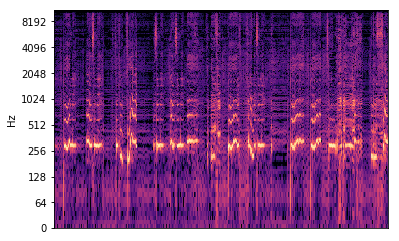

In [12]:
predicted_batch = run(encoder, decoder, start_sequences, 20)

predicted_audio_a = griffin_lim(predicted_batch[0].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_a) 

IPython.display.Audio(predicted_audio_a, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


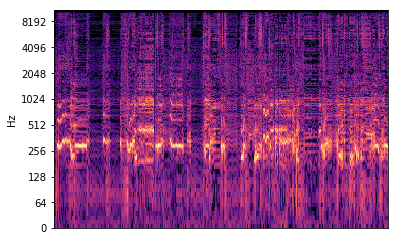

In [13]:
predicted_audio_b = griffin_lim(predicted_batch[1].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_b) 

IPython.display.Audio(predicted_audio_b, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


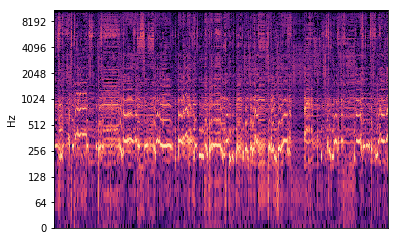

In [14]:
predicted_audio_c = griffin_lim(predicted_batch[2].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_c) 

IPython.display.Audio(predicted_audio_c, rate=dataset.sample_rate)

/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/util/utils.py:1725: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if np.issubdtype(x.dtype, float) or np.issubdtype(x.dtype, complex):
/home/eavi/leon/leon/lib/python3.5/site-packages/librosa/display.py:656: FutureWarning: Conversion of the second argument of issubdtype from `complex` to `np.complexfloating` is deprecated. In future, it will be treated as `np.complex128 == np.dtype(complex).type`.
  if np.issubdtype(data.dtype, np.complex):


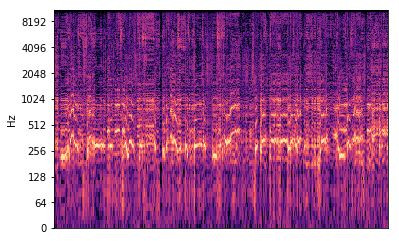

In [15]:
predicted_audio_d = griffin_lim(predicted_batch[3].T, 
                                n_iter=100, 
                                window='hann', 
                                n_fft=fft_size, 
                                hop_length=hop_length)
plot_audio(predicted_audio_d) 

IPython.display.Audio(predicted_audio_d, rate=dataset.sample_rate)